# **Breast Cancer Diagnosis: Inference & Classification Project**

**Claire Remolano**

**April 2026**

---

## **Project Overview**

### **Goal**:
Develop an interpretable and high-performing model to classify tumor cell nuclei as malignant or benign, while identifying key diagnostic features associated with malignancy.

This project combines:
- Statistical inference to understand feature relationships
- Machine learning classification to optimize predictive performance

The models are designed to support decision-making in clinical settings by offering reliable predictions and interpretable insights. The project emphasizes the importance of model transparency and the clinical relevance of identified features, contributing to both accuracy and trust in machine learning applications for medical diagnosis.

---

### **Objectives**:
1.  Identify tumor cell nuclei characteristics most associated with malignancy
2.  Build and compare classification models for diagnosis prediction
3.  Optimize classification thresholds to prioritize recall (minimize false negatives)
4.  Analyze model behavior and errors using SHAP

---

### **Dataset**
The Breast Cancer Wisconsin Diagnostic Dataset contains 569 tumor cell nuclei samples with 30 numerical features derived from digitized biopsy images. The numerical features are the "worst" (the mean of the three largest values) and "mean" (average values) measurements per nucleus of a tumor along with its variability, "error" to include:
- Tumor cell nuclei size (radius, area, perimeter)
- Texture
- Shape irregularity (concavity, symmetry, fractal dimension)

---

### **Methodology**
#### **Data Preparation & Feature Selection**

Each target observation was re-labeled to indicate the presence of disease as:

  `0 = Benign`

  `1 = Malignant`

As clinical practice focuses on the abnormal findings, the "worst" features were priortized over the "mean" features.  The "error" features were excluded from both inference and classification model as they are related to the mean values.

For models with linear or distance-based assumptions, skewed features (calculated skew > 1) were log- transformed, then scaled, and Variance Inflation Factor (VIF) filtering was applied to remove multicollinear features where the estimator required it.

#### **Statistical Inference**

For robustness and to reduce small-sample bias, Firth's logistic regression was done with bootstrapping (drawing 5000 samples with replacement) to infer the most prevalent features that determine malignancy.

**Bootstrapped Firth's Logistic Regression Results**:
Bootstrap resampling showed that tumor cell nuclei characteristics related to size and shape irregularity, particularly worst radius (log-transformed), worst texture, and smoothness-related features, are robust and associated with malignancy. While the log of worst radius emerged as the strongest predictor, its effect is interpreted with caution due to quasi-separation, which can inflate coefficient estimates despite the penalty.

In contrast, mean symmetry exhibited limited stability across bootstrap samples, suggesting it is not a reliable predictor. Mean smoothness, on the other hand, demonstrated consistent importance in the bootstrap analysis despite not being selected in the initial model, likely reflecting shared variance with correlated features and highlighting the impact of multicollinearity on feature selection.

Overall, these results suggest that malignancy is driven by tumor size and shape irregularity, while secondary features like smoothness contribute more variably depending on context.

#### **Classification Models**

*Tree-based/boosting models*

- Random Forest
- CatBoost
- **XGBoost**
- LightGBM
- Decision Tree

*Linear models*

- Logistic Regression (along with L1, L2, ElasticNet penalties)
- Naive Bayes

*Distance models*
- Support Vector Machine (linear and RBF kernels)
- K-Nearest Neighbors

**Evaluation Metrics**

Given the clinical importance of minimizing missed malignant cases, the **F2 score** was selected as the primary evaluation metric in model selection to place greater weight on recall than precision.

To further support this objective and understanding, RandomizedSearchCV was used to tune hyperparameters per model with PR-AUC to better reflect performance on the malignant class since there is a moderate class imbalance (37.2% of the cases are malignant).

Additionally, classification thresholds were optimized rather than fixed at the default = 0.5. A coarse-to-fine grid search during cross-validation identified lower optimal thresholds (0.2-0.38), which improved sensitivity.

Other metrics including recall, precision, log loss, Brier score, and expected calibration error were used to provide a comprehensive assessment of discrimination and calibration performance.

**Classification Models' Results**

**Best Model: *XGBoost***

**F2 score: 0.987**

Recall: 98.4%

Precision: 1.00

Brier score: 0.0159

PR-AUC: 0.995

Accuracy: 99.4%


**Top Model Explainability (SHAP Analysis)**

The tumor cell nuclei size, specifically **worst radius** is shown to be the most influential predictor of malignancy. Shape-related features such as concave points contribute significantly which indicate irregular tumor cell nuclei boundaries are key signals. In contrast, fractal dimension and symmetry have minimal impact, suggesting redundany or weak predictive power. XGBoost prioritizes size (radius) and shape irregularity (concave points and compactness) over other metrics (symmetry and fractal dimension).

The SHAP dependence plot for worst radius shows a strong non-linear relationship with the model output where lower values of worst radius favors benign prediction, while higher values indicate malignant prediction. There is an interaction with worst concavity in which concavitity strengthens the contribution of worst radius to a malignant prediction, indicating that XGBoost captures an interaction where larger and more irregular tumor cell nuclei have a higher probability of malignant classification.

**Error Analysis**

XGBoost had 1 misclassification in mistaking a sample as benign instead of malignant with high confidence.  Strong influential features, such as worst radius, pushed the classification towards a benign prediction while weaker signals of malignancy were insufficient to overcome them. The sample’s feature values fall within the transition zone of peaks in featues with multimodal distribution, indicating that the error arises from overlapping or borderline feature patterns rather than outliers.

---

### **Conclusion**

The worst radius is the predominant feature seen in both the inference, bootstrapped Firth's Logistic Regression, and best classification model, XGBoost, reinforcing its central role in distinguishing malignant from benign tumor cell nuclei.   

Across models, predictive performance was consistently strong, indicating that tumor cell nuclei characteristics provide a highly informative signal for malignancy. Tree-based methods, such as XGBoost, captured non-linear relationships and feature interactions that enhanced discrimination while maintaining strong calibration. Threshold optimization further improved clinical utility by weighing recall more heavily than precision, reducing the risk of missed malignant cases.

The single misclassification occurred in an ambiguous observation with feature values within typical ranges, highlighting a key limitation that even high-performing models may struggle in borderline cases. This underscores the importance of integrating model predictions with clinical judgment rather than relying on them in isolation.

---

### **Limitations**

This is a small dataset of 569 samples where features are derived and without additional information on patient history. External validation is required for global application.

---

### **Future Considerations**

To expand upon this project, would consider incorporating larger datasets enriched with patient history, applying deep learning models to raw imaging data, and conducting a decision-curve analysis to better align model thresholds with clinical risk trade-offs.

---

## **AI Disclaimer**
Portions of this project were developed with the assistance of AI, including code suggestions, debugging support, and refinement of explanations. All code was reviewed and validated by the author.

In [135]:
# Install packages
!pip install -q -r requirements.txt

In [136]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import shap

from sklearn.datasets import load_breast_cancer

from sklearn.model_selection import train_test_split
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from sklearn.inspection import permutation_importance
from sklearn.base import BaseEstimator, TransformerMixin
from scipy.stats import loguniform, zscore

from abc import ABC, abstractmethod
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV

from firthmodels import FirthLogisticRegression
from sklearn.dummy import DummyClassifier
from sklearn.model_selection import StratifiedKFold, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

import warnings
import pickle
from copy import deepcopy
from pathlib import Path

from sklearn.metrics import (accuracy_score, average_precision_score, precision_score, recall_score,
                             f1_score, fbeta_score, roc_auc_score,
                             brier_score_loss, log_loss, precision_recall_curve, RocCurveDisplay,
                             confusion_matrix, ConfusionMatrixDisplay)
from sklearn.calibration import calibration_curve
from sklearn.utils.validation import check_is_fitted

from eda import (plot_feature_grid, plot_hist, plot_box, plot_violin, plot_linearity,
                        plot_target_distribution, plot_corr_clustermap)
from data_processing import VIFSelector, apply_transform, identify_skewed_features, SafeTransformer, DataFrameScaler
from modeling import (run_baseline, BaseInferenceModel, PreprocessingPipeline,
                      FirthLogisticModel, MLELogisticModel, LogisticInferencePipeline, InferenceResult,
                      BootstrapInference, get_probabilities, compute_ece,
                      PipelineBuilder, ModelTrainer, CrossValidator, ModelAnalyzer, ModelEvaluator, ModelVisualizer)

In [137]:
import logging

logging.basicConfig(
    level = logging.INFO,
    format = '%(asctime)s | %(levelname)s | %(message)s',
    datefmt = '%H:%M:%S',
    force = True
)

logging.info('Configuration works.')

21:21:07 | INFO | Configuration works.


This project is created in Google Colab with created files saved in the Google Drive specified path.

In [138]:
# Mount Google Drive first
from google.colab import drive
drive.mount('/content/drive')

# Base project path on Google Drive
BASE_PATH = Path('/content/drive/MyDrive/sklearn/bc4')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## Data

The Wisconsin Breast Cancer Dataset contains 569 tumor cell nuclei samples with 30 numerical features derived from digitized biopsy images. The features are divided into 3 categories where "worst" (the mean of the three largest values), "mean" (average values), and "error" (variability) features are measurements per nucleus of a tumor.

Data characteristics noted:

1. There is **no missing data**.
2. There are 212 malignant cases and 357 benign cases.
    *   Benign > malignant
    *   Original dataset labels target as `1` = benign and `0` = malignant
    *   Re-label `1 = malignant` and `0 = benign` for consistency with standard classification conventions.




In [139]:
# Load and review data
data = load_breast_cancer(as_frame = True)
type(data)

sklearn.utils._bunch.Bunch

In [140]:
# Understand the breast cancer dataset and its features
print(data.DESCR)

.. _breast_cancer_dataset:

Breast cancer wisconsin (diagnostic) dataset
--------------------------------------------

**Data Set Characteristics:**

:Number of Instances: 569

:Number of Attributes: 30 numeric, predictive attributes and the class

:Attribute Information:
    - radius (mean of distances from center to points on the perimeter)
    - texture (standard deviation of gray-scale values)
    - perimeter
    - area
    - smoothness (local variation in radius lengths)
    - compactness (perimeter^2 / area - 1.0)
    - concavity (severity of concave portions of the contour)
    - concave points (number of concave portions of the contour)
    - symmetry
    - fractal dimension ("coastline approximation" - 1)

    The mean, standard error, and "worst" or largest (mean of the three
    worst/largest values) of these features were computed for each image,
    resulting in 30 features.  For instance, field 0 is Mean Radius, field
    10 is Radius SE, field 20 is Worst Radius.

    - 

In [141]:
# Assess data types and missingness
df = data.frame
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 569 entries, 0 to 568
Data columns (total 31 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   mean radius              569 non-null    float64
 1   mean texture             569 non-null    float64
 2   mean perimeter           569 non-null    float64
 3   mean area                569 non-null    float64
 4   mean smoothness          569 non-null    float64
 5   mean compactness         569 non-null    float64
 6   mean concavity           569 non-null    float64
 7   mean concave points      569 non-null    float64
 8   mean symmetry            569 non-null    float64
 9   mean fractal dimension   569 non-null    float64
 10  radius error             569 non-null    float64
 11  texture error            569 non-null    float64
 12  perimeter error          569 non-null    float64
 13  area error               569 non-null    float64
 14  smoothness error         5

In [142]:
# Describe data
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,0.627417
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,0.483918
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,0.000000
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,0.000000
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,1.000000
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,1.000000
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,1.000000


Several features exhibit redundancy, as variables such as perimeter and area are derived from radius. Feature distributions vary in scale, and some show evidence of right skewness, as indicated by maximum values that are substantially larger than their means.

In [143]:
# Check the labels of the 'target' feature
df['target'].value_counts()

,count
target,
1,357
0,212


The malignant cases are labeled as 0 while the benign cases are labeled as 1.  

In [144]:
df.head()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension,target
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,0.07871,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,0
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,0.05667,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,0
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,0.05999,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,0
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,0.09744,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,0
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,0.05883,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,0


In [145]:
# Prepare data where target is y. 1 = malignant, 0 = benign
X = df.drop('target', axis = 1)
y = (df['target'] == 0).astype(int)

For clarity and to adhere to standard convention, re-labeled the target values so that 1 = malignant and 0 = benign. This ensures that metric, such as predicted probabilities, recall, and precision, are in relation to malignancy.

In [146]:
# Split data into train and test sets 70/30.
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=42
)

print(f'Shape of feature training set: {X_train.shape}, and \n'
      f'Shape of target training set: {y_train.shape}')
print(f'Proportion of target values: {y_train.value_counts(normalize=True)}')
print(f'Shape of feature test set: {X_test.shape}, and \n'
      f'Shape of target test set: {y_test.shape}')

# Prepare EDA with training set
eda_df = pd.concat([X_train, y_train.rename('target')], axis=1)

Shape of feature training set: (398, 30), and 
Shape of target training set: (398,)
Proportion of target values: target
0    0.628141
1    0.371859
Name: proportion, dtype: float64
Shape of feature test set: (171, 30), and 
Shape of target test set: (171,)


## Exploratory Data Analysis (EDA)

The EDA was conducted on the training dataset, which comprises 70% of the overall data and created by stratified random sampling to preserve the class distribution.

### Target Distribution

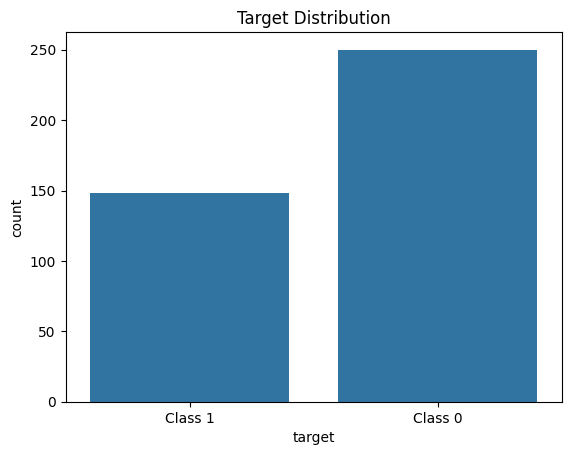

In [147]:
# Target Distribution
plot_target_distribution(eda_df['target'])

There are nearly twice as many benign cases as malignant cases in the training dataset. For modeling, metrics that consider class imbalance should be considered.

### Histograms

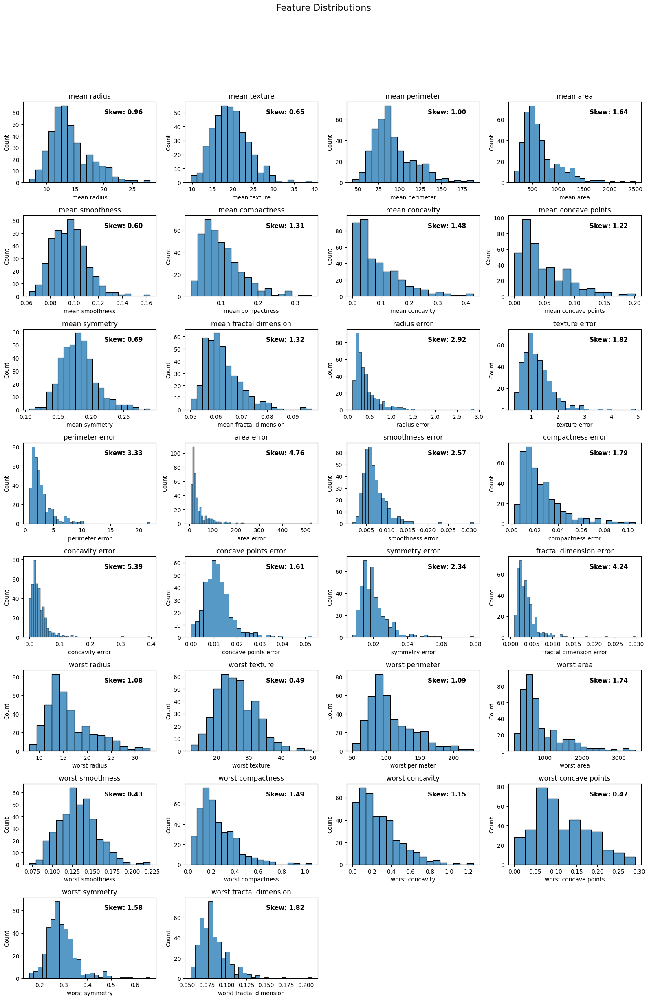

In [148]:
# Feature Distributions
plot_feature_grid(eda_df, plot_hist, cols=4, suptitle='Feature Distributions')

The majority of the features exhibit right-skewed distributions, indicating the presence of outliers.  Depending on model assumptions, these features may benefit from log-transformation to stabilize variance and improve model performance.

### Box Plots

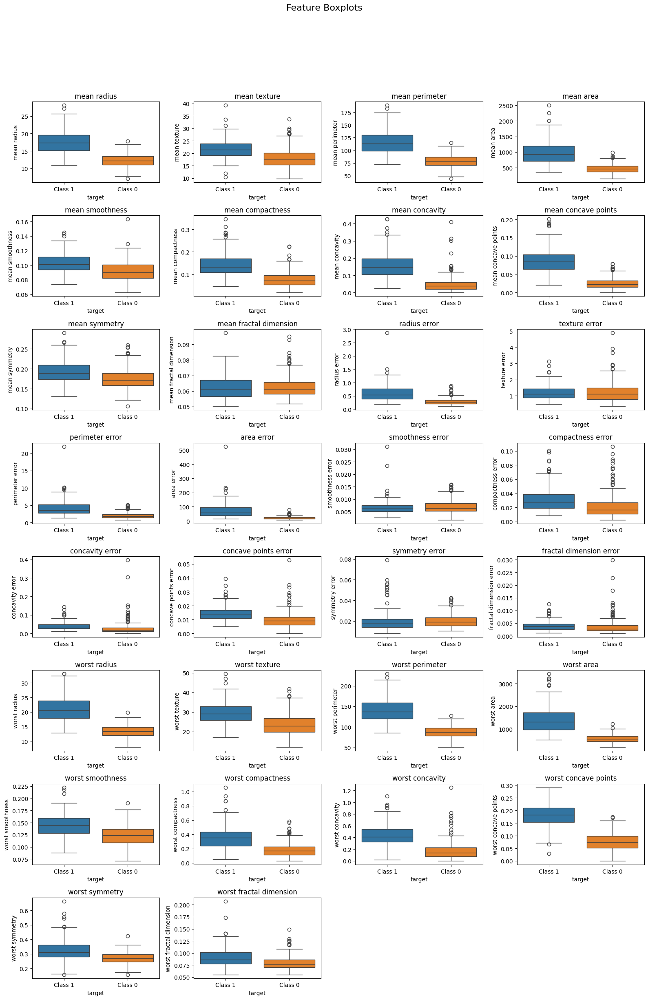

In [149]:
# Box plots
plot_feature_grid(
    df=eda_df,
    plot_func=plot_box,
    cols=4,
    suptitle='Feature Boxplots',
    target='target',
    hue = 'target'
)

The benign cases tend to have smaller values, interquartile ranges and spread.  Worst radius and worst concave points show strong class separation where their interquartile ranges do not overlap between benign and malignant cases. Some overlap (outside the interquartile range) does remain in these features overall, which indicates high but not perfect discriminative power.

### Violin Plots

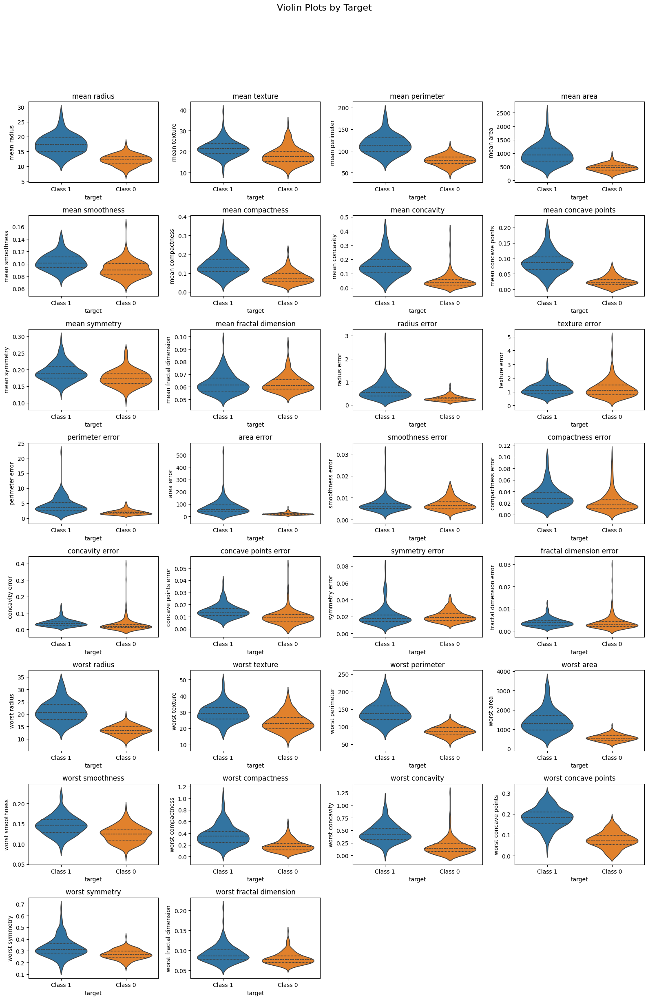

In [150]:
# Violin Plots by Target

plot_feature_grid(
    df=eda_df,
    plot_func=plot_violin,
    cols=4,
    suptitle= 'Violin Plots by Target',
    target = 'target',
    hue = 'target'
)

Violin plots reinforce the findings in the box plots where "worst" and "mean" features provide strong class separation. Malignant tumor cell nuclei generally exhibit higher values across the features with density concentrated at higher ranges; the primary distinction is a shift in distribution rather than consistent difference in variability.

"Error" features are unlikely to contribute meaningful predictive signal and may introduce noise to the models given their high overlap and limited separation.

### Correlation Matrix and Heatmap

In [151]:
# Correlation Matrix with threshold = 0.8
corr_matrix = eda_df.corr()
threshold = 0.8
corr_pairs = corr_matrix.abs().unstack()
high_corr = corr_pairs[(corr_pairs > threshold) & (corr_pairs < 1.0)].sort_values(ascending=False).drop_duplicates()
high_corr = high_corr.reset_index()
high_corr.columns = ['Feature 1', 'Feature 2', 'Correlation']
display(high_corr)

,Feature 1,Feature 2,Correlation
0,mean radius,mean perimeter,0.997743
1,worst radius,worst perimeter,0.993375
2,mean radius,mean area,0.988068
3,mean area,mean perimeter,0.986890
4,worst radius,worst area,0.985483
5,worst area,worst perimeter,0.977782
6,perimeter error,radius error,0.975750
7,mean perimeter,worst radius,0.969029
8,worst radius,mean radius,0.968609
9,worst perimeter,mean perimeter,0.968457


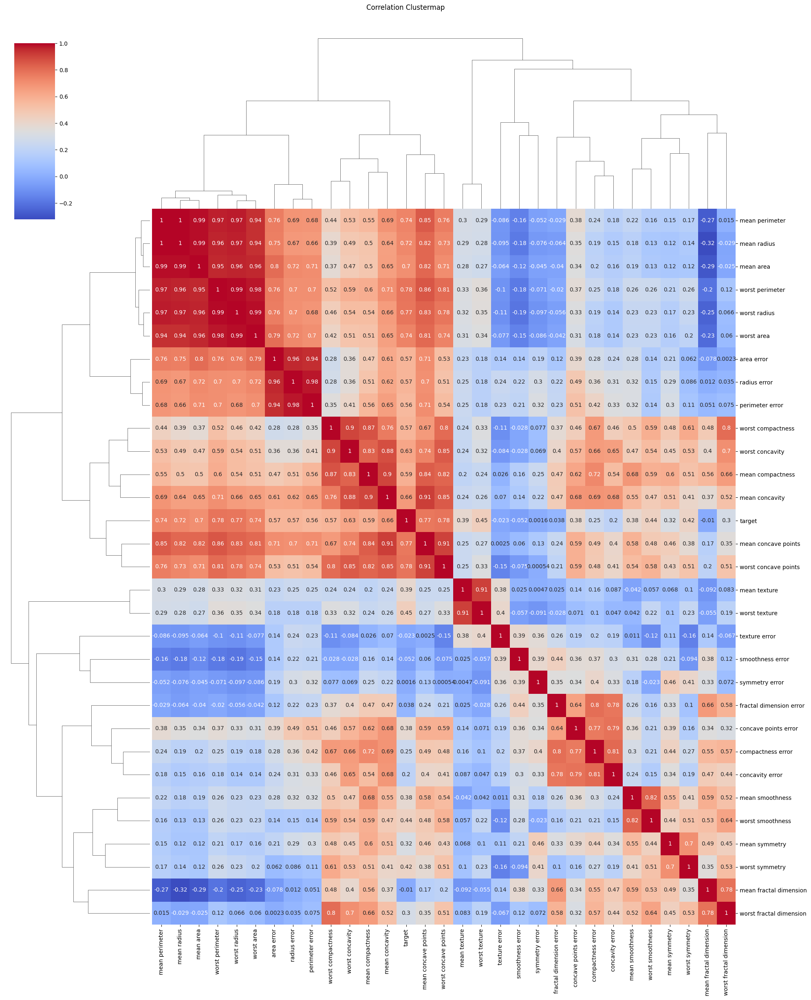

In [152]:
# Clustermap
plot_corr_clustermap(corr_matrix)

Strong correlations (> 0.9) are observed among features related to tumor cell nuclei size, such as radius, perimeter, and area. "Mean" and "worst" measurements of concavity and concave points are also highly correlated. This degree of multicollinearity suggests that feature selection is likely necessary to reduce redundancy and improve model stability.

#### Top 3 Features

In [153]:
# Top 3 Features Correlated with Target
corr_target = eda_df.corr()['target'].abs().sort_values(ascending=False)
top3 = corr_target[1:4]
print('Top 3 features correlated with Target:\n', top3)

Top 3 features correlated with Target:
 worst perimeter         0.781133
worst concave points    0.779404
worst radius            0.774868
Name: target, dtype: float64


While worst perimeter shows the highest correlation with the target, it is a linear transformation of the radius, and therefore, provides redundant information. Worst radius is preferred as a representative size-related feature. In contrast, the worst concave points feature captures a distinct structural characteristic and is likely to be a significant predictor of malignancy.

### Pairplots

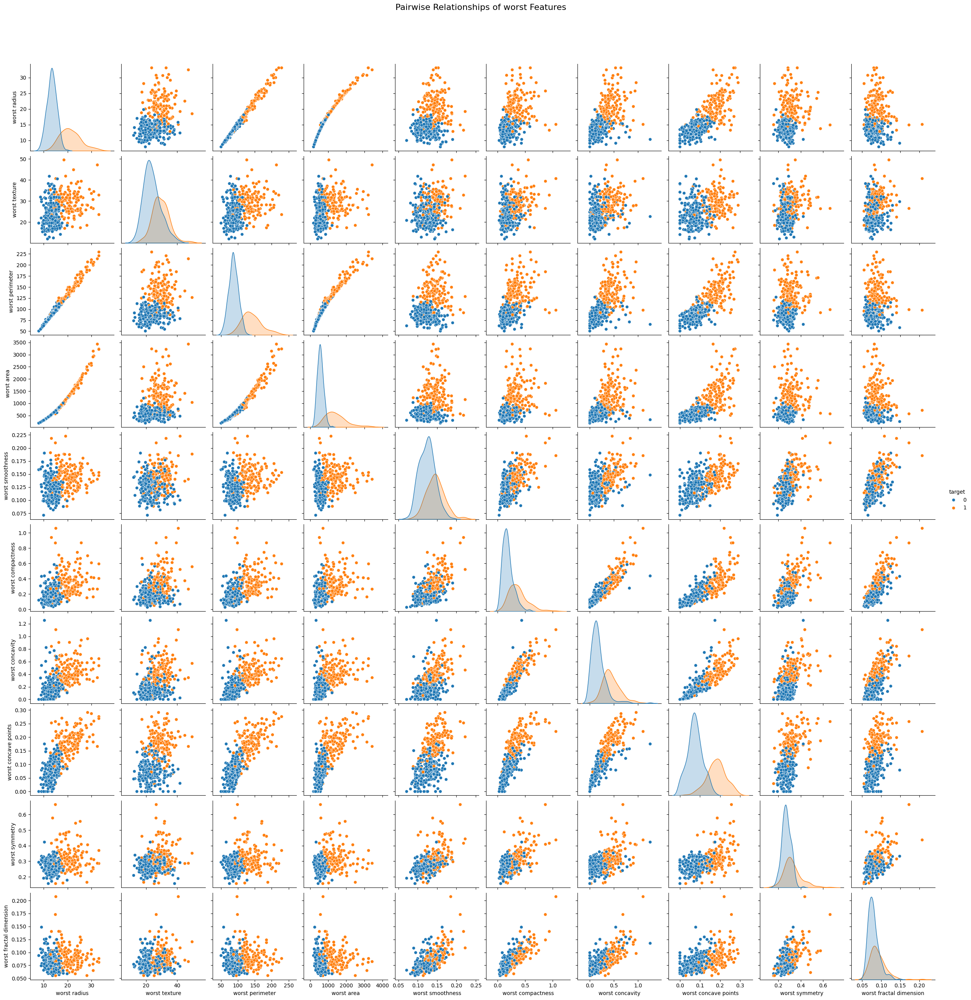

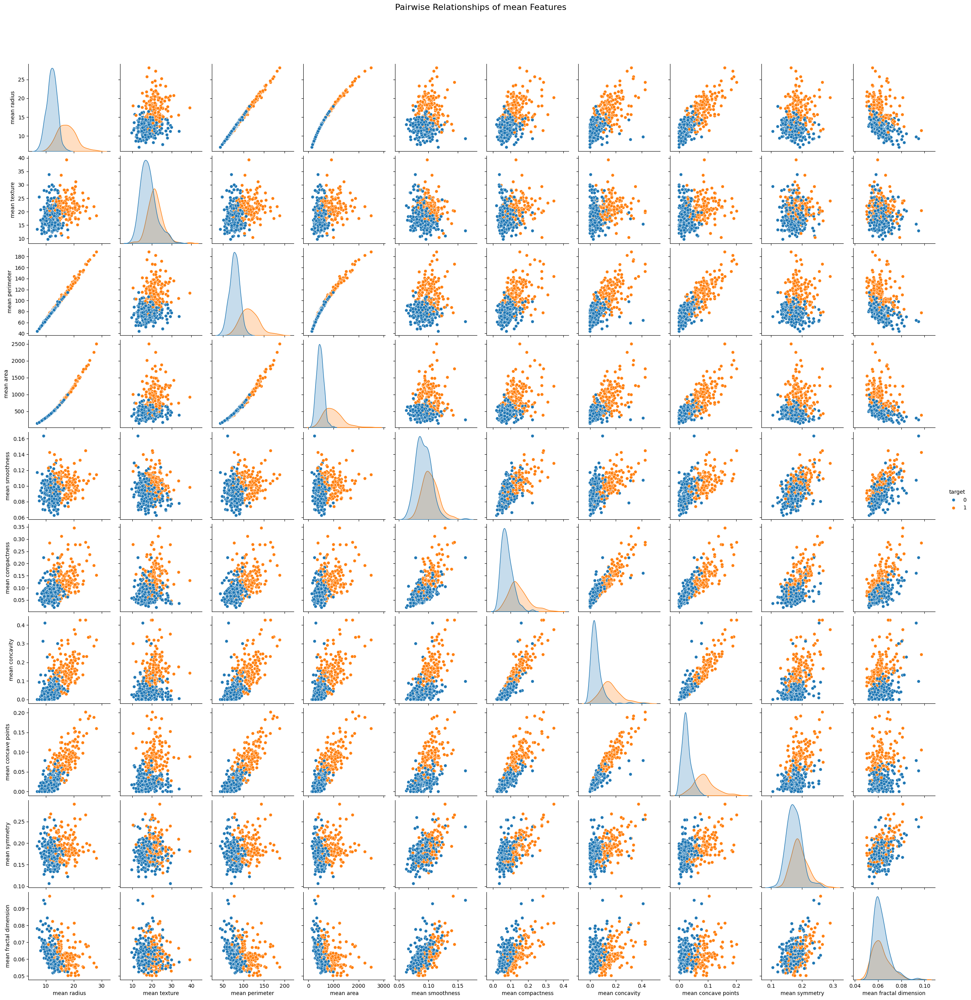

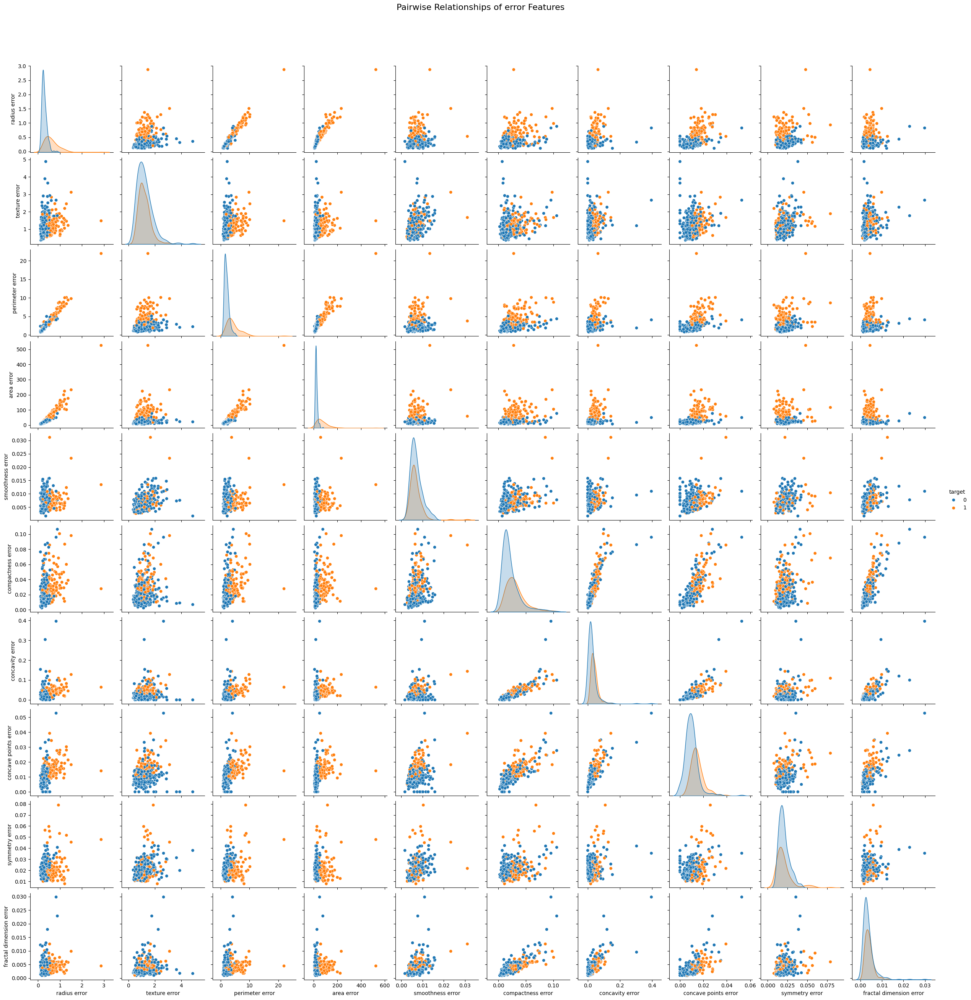

In [154]:
# Pairwise Relationships for 'worst', 'mean', 'error'
for col_group in ['worst', 'mean', 'error']:
    new_cols = [c for c in eda_df.columns if col_group in c] + ['target']
    sns.pairplot(eda_df[new_cols], hue='target').fig.suptitle(
        f'Pairwise Relationships of {col_group} Features', y=1.05, fontsize=16
    )
    plt.show()

The pairplots reinforce previous findings and show strong correlations among size-related features (radius, perimeter, and area). Features also form clusters based on size, shape, and texture, suggesting underlying structure and dependence among variables.

While overlap exists, certain feature combinations, such as worst radius and worst concave points, show clear separation between benign and malignant classes, indicating that a reduced feature set can improve model performance and interpretability.

## Feature Selection

Since the goal of inference is interpretability, features were selected based on clinical relevance ("worst" > "mean" features for biopsy abnormality assessment) and redundancy elimination (area and perimeter are geometric functions of radius and thus collinear by construction). "Error" features reflect within-image variability rather than the abnormality being assessed and thus are dropped for both inference and classification models.


On the other hand, classification models received a broader feature set including mean radius, mean concave points and mean texture, which were excluded from the inference model to reduce collinearity (correlation > 0.9). The classification models will use the larger feature set and the model pipeline will eliminate featues as needed.

In [155]:
# ----------------
# Inference model
# ----------------

# Extract worst and mean columns
keep_cols = [c for c in X.columns if c.startswith('worst ') or c.startswith('mean ') ]

# Drop area and perimeter columns
X_sel = X[keep_cols].drop(columns = ['worst perimeter', 'worst area', 'mean perimeter', 'mean area',
                                     'mean radius', 'mean texture', 'mean concave points'])

# Inference dataset
X_infer = X_sel.copy()

# -----------------------
# Classification models
# -----------------------
X_sel_class = X[keep_cols].drop(columns = ['worst perimeter', 'worst area', 'mean perimeter', 'mean area'])

X_train = X_train[X_sel_class.columns]
X_test = X_test[X_sel_class.columns]

## Logistic Inference Model


Firth's logistic regression model was selected to identify predictors of malignancy while addressing quasi-separation and small sample bias. The features with a skew > 1 were log-transformed, all features were scaled, and features were removed if VIF > 3 to reduce multicollinearity.

To further evaluate robustness, bootstrapping with 5000 iterations was done to the full modeling pipeline. This enabled estimation of confidence intervals and stability in feature selection, reflecting a feature's statistical significance and reliability through resampling.

In [156]:
# Instantiate and Fit Logistic Inference Model

model_intent = {'scale': True, 'transform': True, 'vif': True}
inf_model = LogisticInferencePipeline(
    intent = model_intent,
    estimator=FirthLogisticModel(),
    vif_thresh=3.0
)

inf_model.fit(X_infer, y)

/content/modeling.py:414: RuntimeWarning: Profile-likelihood CI failed for: ['worst concavity']. CI bounds are equal; quasi-separation likely. These features are flagged unstable_ci = True in the table.
  warnings.warn(


In [157]:
print(f'Converged: {inf_model.estimator.model_.converged_}')

Converged: True


In [158]:
# Inference Results
inf_result = inf_model.get_result()
inf_table = inf_result.to_table()

print("=== Inference Table ===")
display(inf_table)

=== Inference Table ===


,feature,transformation,coefficient,std_error,z_value,p_value,OR_per_SD,ci_lower_OR,ci_upper_OR,unstable_ci
0,worst radius,log,7.117735,0.596446,11.933571,7.910539e-33,1233.652676,NaN,NaN,True
1,worst texture,raw,1.740275,0.303405,5.735822,9.704038e-09,5.698911,3.129669,11.535067,False
2,worst smoothness,raw,1.626514,0.405513,4.011007,6.046039e-05,5.086116,2.318631,12.664085,False
3,mean symmetry,raw,1.015682,0.455243,2.231078,2.567596e-02,2.761247,1.130842,6.868755,False
4,worst concavity,log,-0.508887,0.729101,-0.697965,4.851992e-01,0.601164,NaN,NaN,True
5,mean fractal dimension,log,0.129676,0.444790,0.291545,7.706343e-01,1.138460,0.463943,2.675962,False
6,worst symmetry,log,-0.079623,0.389344,-0.204504,8.379594e-01,0.923465,0.434111,2.014351,False


The Firth's logistic regression model suggests that log-transformed worst radius is a strong predictor with a large effect size, yet its unstable confidence interval suggests quasi-separation and is interpreted with caution.

Worst texture (OR: 5.7, CI: 3.13-11.54), worst smoothness (OR: 5.09, CI: 2.32-12.66), and mean symmetry (OR:2.76, CI: 1.13-6.87) are statistically significant and have stable positive associations, with each one–standard deviation increase associated with 5.7x, 5.09x, and 2.76x higher odds of malignancy (respectively), holding all other variables constant.

### Bootstrap Model

The bootstrap analysis shows that features regarding tumor cell shape and irregularity (e.g. worst radius, worst texture, worst smoothness, and mean smoothness) are the most robust and meaningful predictors of malignancy across resampled data.  

In [159]:
# Bootstrap for robustness
bootstrap_model = BootstrapInference(
    base_model = inf_model,
    n_bootstrap = 5000,
    random_state = 42
)

bootstrap_model.fit(X_infer, y)

Streaming output truncated to the last 5000 lines.
/content/modeling.py:414: RuntimeWarning: Profile-likelihood CI failed for: ['worst radius']. CI bounds are equal; quasi-separation likely. These features are flagged unstable_ci = True in the table.
  warnings.warn(
/content/modeling.py:414: RuntimeWarning: Profile-likelihood CI failed for: ['worst concavity']. CI bounds are equal; quasi-separation likely. These features are flagged unstable_ci = True in the table.
  warnings.warn(
/content/modeling.py:414: RuntimeWarning: Profile-likelihood CI failed for: ['mean fractal dimension', 'worst concavity']. CI bounds are equal; quasi-separation likely. These features are flagged unstable_ci = True in the table.
  warnings.warn(
/content/modeling.py:401: ConvergenceWarning: Profile-likelihood CI did not converge for parameter 4 (lower bound) after 25 iterations.
  ci = self.model_.conf_int(method = self.ci_method)
/content/modeling.py:414: RuntimeWarning: Profile-likelihood CI failed for: [

During bootstrapping, warnings appeared for large coefficients and non-convergent profile-likelihood confidence intervals, primarily due to quasi-separation in highly predictive features such as worst radius. These warnings indicate that some features nearly perfectly discriminate outcomes in a small dataset, which can make standard CI estimation unstable.

However, Firth's logistic regression mitigates bias from quasi-separation, and the bootstrap pipeline provides empirical odds ratios, selection frequencies, and sign consistency metrics. Despite these warnings, the results remain reliable for identifying statistically significant predictors of malignancy.

### Bootstrap Selection Frequency

In [160]:
# Bootstrap threshold
bootstrap_thresh = 0.8

# Retrieve feature selection frequency from bootstrapping
stability = bootstrap_model.get_stability_selection()
stability['robust'] = stability['selection_frequency'] >= bootstrap_thresh

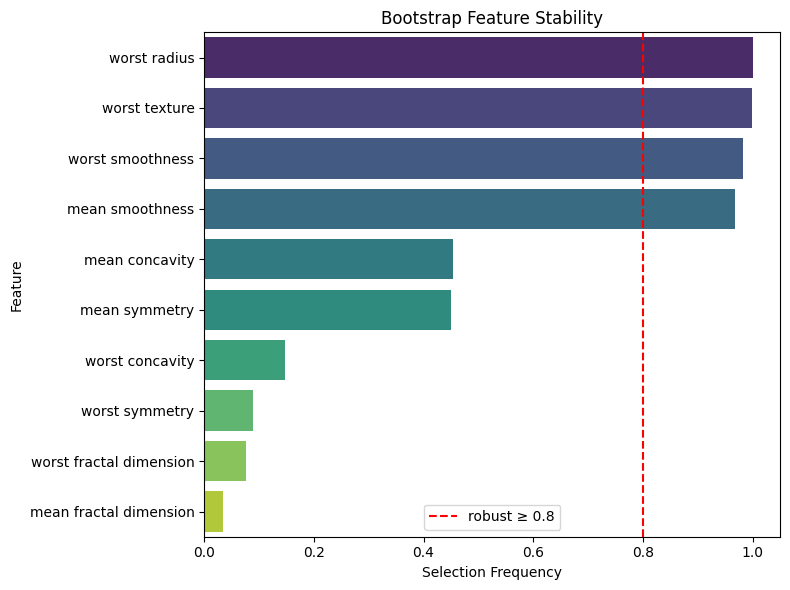

In [161]:
# Bootstrap selection frequency plot
bootstrap_model.plot_selection_frequency()

The bootstrap results show that worst radius, worst texture, worst smoothness, and mean smoothness are selected in over 80% of resamples, indicating these features are stable predictors of malignancy across different subsets of the data. The inclusion of both worst and mean smoothness suggests that surface irregularity is an important characteristic, although their joint selection likely reflects an underlying correlation rather than fully independent effects.

### Inference Table & Forest Plot

In [162]:
# Build merged table for plotting
bootstrap_data = bootstrap_model.build_forest_data(inf_table)

print('=== Logistic Inference Table with Bootstrap===')
display(bootstrap_data)

=== Logistic Inference Table with Bootstrap===


,feature,OR_bootstrap,ci_lower_bootstrap,ci_upper_bootstrap,sign_consistency,selection_frequency,robust,stability_score,transformation,coefficient,std_error,z_value,p_value,OR_per_SD,ci_lower_OR,ci_upper_OR,unstable_ci
0,worst radius,1830.542088,174.315577,129740.081677,1.000000,1.000000,True,1.000000,log,7.117735,0.596446,11.933571,7.910539e-33,1233.652676,NaN,NaN,True
1,worst texture,6.657221,3.449082,20.819380,1.000000,0.999599,True,0.999599,raw,1.740275,0.303405,5.735822,9.704038e-09,5.698911,3.129669,11.535067,False
2,worst smoothness,5.918263,2.385154,27.540244,1.000000,0.981838,True,0.981838,raw,1.626514,0.405513,4.011007,6.046039e-05,5.086116,2.318631,12.664085,False
3,mean smoothness,4.970112,2.271308,12.489249,1.000000,0.967391,True,0.967391,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,mean symmetry,2.573533,0.890926,7.099861,0.963640,0.450335,False,0.433961,raw,1.015682,0.455243,2.231078,2.567596e-02,2.761247,1.130842,6.868755,False
5,mean concavity,13.504071,0.399977,3200.887306,0.839623,0.454009,False,0.381197,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
6,worst concavity,1.621045,0.153458,1982.526781,0.726004,0.147222,False,0.106883,log,-0.508887,0.729101,-0.697965,4.851992e-01,0.601164,NaN,NaN,True
7,worst symmetry,0.918512,0.325306,3.141264,0.595186,0.088666,False,0.052773,log,-0.079623,0.389344,-0.204504,8.379594e-01,0.923465,0.434111,2.014351,False
8,worst fractal dimension,0.937108,0.200377,2.807651,0.500000,0.077075,False,0.038538,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
9,mean fractal dimension,0.951181,0.227478,2.409129,0.518295,0.034360,False,0.017808,log,0.129676,0.444790,0.291545,7.706343e-01,1.138460,0.463943,2.675962,False


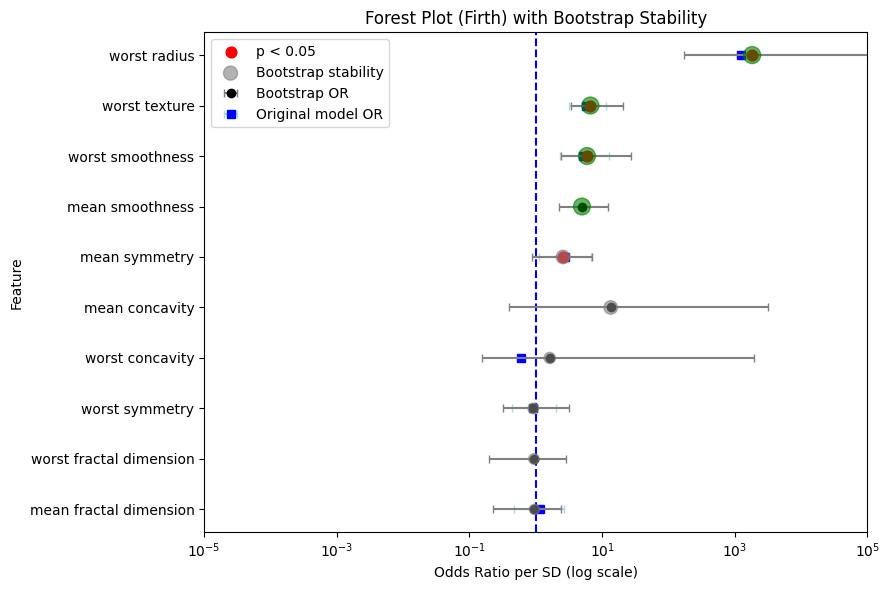

In [163]:
# Forest Plot
inf_result.plot_forest(
    data=bootstrap_data,
    primary='OR_bootstrap',
    primary_lower='ci_lower_bootstrap',
    primary_upper='ci_upper_bootstrap',
    secondary='OR_per_SD',
    secondary_lower='ci_lower_OR',
    secondary_upper='ci_upper_OR',
)

The bootstrap results support the robustness of tumor cell nuclei characteristics with regards to size and shape irregularity as key predictors of malignancy (e.g. worst radius, worst texture, worst smoothness, and mean smoothness).  Worst radius is the strongest predictor but should be interpreted with caution due to quasi-separation concerns.

While mean symmetry was deemed significant in the initial model, the bootstrap results indicates that it is not as robust, stable, and does not consistently contribute to diagnosis. On the other hand, mean smoothness is deemed important in the bootstrapping even though it was not included in the initial model which may be due to its correlation to other features.



## Classification Models


The classification task aims to predict whether a sample is benign or malignant. Using a stratified baseline (F2 = 0.286, recall = 28.1%), 13 models including linear, distance-based, and tree-based approaches were cross-validated with optimized thresholds. The final model was selected based on its F2 score, recall, and Brier score, and the model pipeline ensures reproducible feature transformations, threshold tuning, and detailed error analysis.

### Baseline Model

In [164]:
baseline = run_baseline(X_train, y_train, X_test, y_test)
print(baseline)

{'model': 'Baseline (stratified)', 'accuracy': 0.49122807017543857, 'precision': 0.3050847457627119, 'recall': 0.28125, 'f1': 0.2926829268292683, 'f2': 0.2857142857142857, 'pr_auc': np.float64(0.35481093269897906), 'roc_auc': np.float64(0.44903621495327106), 'brier_score': np.float64(0.5087719298245614), 'log_loss': 18.337999092708728, 'ece': 0.5087719298245613}


### Models, model intention with preprocessing dataset, and hyperparameters to explore.

In [165]:
# Define models and parameter grids (as they were defined previously)
models = {
    'Logistic': LogisticRegression(max_iter = 5000, class_weight = 'balanced'),
    'Lasso': LogisticRegression(penalty = 'l1', solver = 'saga', max_iter = 5000, class_weight = 'balanced'),
    'Ridge': LogisticRegression(penalty = 'l2', solver = 'saga', max_iter = 5000, class_weight = 'balanced'),
    'ElasticNet': LogisticRegression(penalty = 'elasticnet', solver = 'saga', l1_ratio = 0.5, max_iter = 5000, class_weight = 'balanced'),
    'RandomForest': RandomForestClassifier(random_state = 42, class_weight = 'balanced'),
    'DecisionTree': DecisionTreeClassifier(random_state = 42, class_weight = 'balanced'),
    'LightGBM': LGBMClassifier(random_state = 42, verbose = -1),
    'XGBoost': XGBClassifier(eval_metric = 'logloss', random_state = 42),
    'CatBoost': CatBoostClassifier(verbose = 0, random_state = 42),
    'SVM rbf': SVC(kernel='rbf', probability = True, C = 1, class_weight = 'balanced'),
    'SVM linear': SVC(kernel = 'linear', probability=True, C = 1, class_weight = 'balanced'),
    'KNN': KNeighborsClassifier(),
    'NaiveBayes': GaussianNB()
}

# Whether to scale, transform, and/ consider VIF with predictors
model_intent = {
    # Linear models
    'Logistic': {'scale': True, 'transform': True, 'vif': True},
    'Ridge': {'scale': True, 'transform': True, 'vif': True},
    'ElasticNet': {'scale': True, 'transform': True, 'vif': True},

    # Lasso does not need VIF removal d/t L1 regularization
    'Lasso': {'scale': True, 'transform': True, 'vif': False},

    # Distance-based models
    'SVM rbf': {'scale': True, 'transform': True, 'vif': True},
    'SVM linear': {'scale': True, 'transform': True, 'vif': True},
    'KNN': {'scale': True, 'transform': True, 'vif': True},

    # Naive Bayes
    'NaiveBayes': {'scale': False,'transform': True,'vif': False},

    # Tree-based/boosting models
    'RandomForest': None,
    'DecisionTree': None,
    'XGBoost': None,
    'LightGBM': None,
    'CatBoost': None
}

#Fine-tuning hyperparameters
param_grids = {
    'Lasso': {'model__C': loguniform(1e-4, 1e4)},
    'Ridge': {'model__C': loguniform(1e-4, 1e4)},
    'ElasticNet': {'model__C': loguniform(1e-4, 1e4),'model__l1_ratio': np.linspace(0.1, 0.9, 9)},
    'RandomForest': {'model__n_estimators':[200,400,600],'model__max_depth':[None,5,10,20],
                     'model__min_samples_split':[2,5,10],'model__min_samples_leaf':[1,2,5]},
    'DecisionTree': {'model__max_depth':[None,5,10,20],'model__min_samples_split':[2,5,10],
                     'model__min_samples_leaf':[1,2,5]},
    'XGBoost': {'model__n_estimators':[200,400,500],'model__max_depth':[3,5,7],
                'model__learning_rate':[0.01,0.05,0.1],'model__subsample':[0.7,0.8,1.0]},
    'LightGBM': {'model__n_estimators':[200,400,500],'model__max_depth':[-1,5],
                 'model__learning_rate':[0.01,0.05,0.1],'model__subsample':[0.7,0.8,1.0]},
    'CatBoost': {'model__iterations':[200,400,500],'model__depth':[4,6,8],'model__learning_rate':[0.01,0.05,0.1]}
}

### Model Training and Evaluation

Multiple classification models are trained and evaluated, based on the model dictionaries and intentions above, to compare performance and understand how different algorithms respond to the dataset. Particular attention is given to feature selection behavior, the impact of correlated variables, and differences in how models prioritize predictive signals.

A summary table is used to consolidate model configurations, including selected features, feature counts, and applied transformations, enabling a structured comparison across model types.

In [166]:
# Cross-validation setup
cv = StratifiedKFold(n_splits = 5, shuffle = True, random_state = 42)

In [167]:
# Instantiate Model Evaluator
evaluator = ModelEvaluator(
    X_train = X_train, y_train = y_train,
    X_test = X_test, y_test = y_test,
    cv = cv,
    models = models,
    param_grids = param_grids,
    model_intent = model_intent,
    scoring = 'average_precision',
    coarse_n = 50, fine_n = 50, zoom_frac = 0.1,
    output_dir = Path(BASE_PATH),
)


In [168]:
# Run evaluator
analyzer = evaluator.run()

In [169]:
# Sanity check to review features and ensure pipeline works for each model
feature_table = evaluator.build_feature_processing_table()

pd.set_option('display.max_rows', None)
display(
    feature_table.sort_values(
        ['model', 'importance', 'coefficient', 'permutation_importance'],
        ascending = [True, False, False, False]
    )
)

,model,feature,transformation,scaled,dropped_by_vif,coefficient,importance,permutation_importance
141,CatBoost,worst radius,raw,False,False,NaN,29.812977,0.065497
138,CatBoost,mean concave points,raw,False,False,NaN,12.102666,0.011696
142,CatBoost,worst texture,raw,False,False,NaN,9.905423,0.012865
146,CatBoost,worst concave points,raw,False,False,NaN,9.127217,0.012281
134,CatBoost,mean texture,raw,False,False,NaN,7.980234,0.004678
133,CatBoost,mean radius,raw,False,False,NaN,6.151510,-0.007018
145,CatBoost,worst concavity,raw,False,False,NaN,5.488889,0.009357
147,CatBoost,worst symmetry,raw,False,False,NaN,3.106963,0.004678
136,CatBoost,mean compactness,raw,False,False,NaN,2.956070,-0.001754
137,CatBoost,mean concavity,raw,False,False,NaN,2.900530,0.002924


The feature table summarizes model coefficients/feature importance/permutation importance and serves as a sanity check to confirm that preprocessing steps (transformation, scaling, and VIF selection) are correctly applied within each pipeline.

In [170]:
feature_table["score"] = (
    feature_table["coefficient"].abs()
    .fillna(feature_table["importance"])
    .fillna(feature_table["permutation_importance"])
)

# Feature summary per model
summary = (
    feature_table[feature_table["dropped_by_vif"] == False]
    .sort_values(["model", "score"], ascending = [True, False])
    .groupby("model")
    .agg(
        top_features = ("feature", lambda x: list(x.head(5))),
        n_features = ("feature", "count"),
        transformation_types = ("transformation", lambda x: x.unique().tolist())
    )
    .reset_index()
)

In [171]:
display(summary)

,model,top_features,n_features,transformation_types
0,CatBoost,"[worst radius, mean concave points, worst text...",16,[raw]
1,DecisionTree,"[worst radius, worst concave points, worst smo...",16,[raw]
2,ElasticNet,"[mean radius, worst concavity, worst compactne...",9,"[raw, log, None]"
3,KNN,"[mean radius, worst smoothness, worst compactn...",8,"[raw, log]"
4,Lasso,"[worst radius, worst concave points, worst tex...",17,"[log, raw, None]"
5,LightGBM,"[worst radius, mean concave points, worst text...",16,[raw]
6,Logistic,"[mean radius, worst smoothness, worst concavit...",9,"[raw, log, None]"
7,NaiveBayes,"[worst radius, mean radius, worst concave poin...",16,"[log, raw]"
8,RandomForest,"[worst radius, mean concave points, worst conc...",16,[raw]
9,Ridge,"[mean radius, worst concavity, worst smoothnes...",9,"[raw, log, None]"


The summary table provides a condensed view of the features included across the models, the number of features and applied transformations.  While tree-based models emphasized worst radius as the dominant feature of importance, the majority of linear and distance-based models remove it and use the mean radius instead likely due to multicollinearity and regularization effects. This pattern shows that tumor cell nuclei size remains a key predictor across all models, although different models select alternative representations of these features depending on their sensitivity to other correlated features.

### Model Visualization

Precision-recall and ROC curves as well as the confusion matrix for the top 5 models are shown in this section to help see the false positives and false negatives in classification.

In [172]:
# Initialize ModelVisualizer to visualize metrics and errors
visualizer = ModelVisualizer(analyzer)

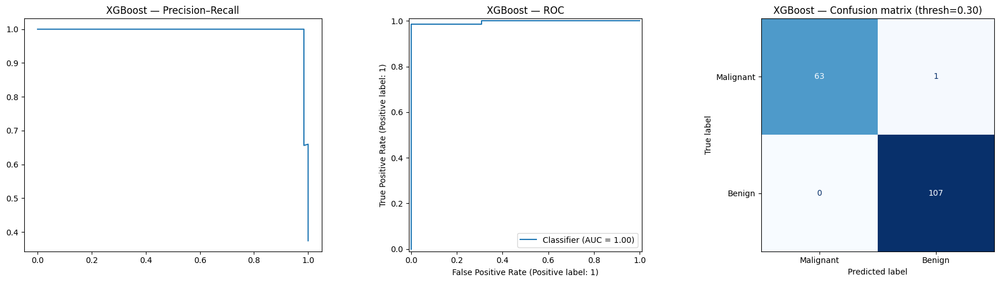


XGBoost — Important Features



,feature,transformation,importance,permutation_importance
0,worst radius,raw,0.235456,0.094152
1,worst texture,raw,0.040606,0.019298
2,mean texture,raw,0.040076,0.018129
3,worst concave points,raw,0.174771,0.017544
4,worst concavity,raw,0.060537,0.016374
5,mean concave points,raw,0.265318,0.016374
6,worst symmetry,raw,0.019019,0.005848
7,mean radius,raw,0.044906,-0.005263
8,mean concavity,raw,0.019032,0.004094
9,mean compactness,raw,0.012869,0.002924


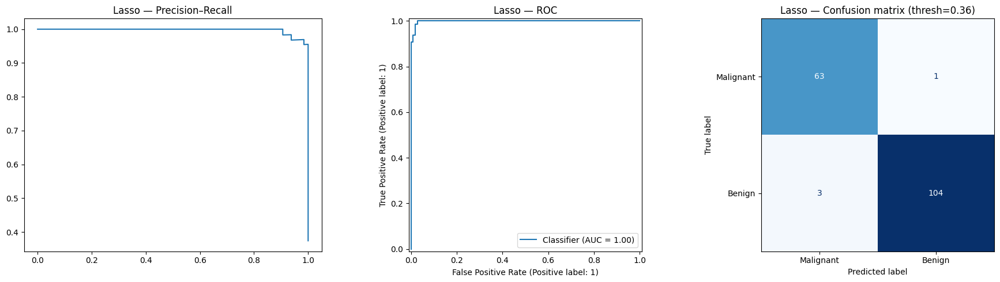


Lasso — Important Features



,feature,transformation,coefficient,permutation_importance
0,worst radius,log,3.347768,0.289474
1,worst concave points,raw,1.108461,0.045029
2,worst texture,raw,0.965701,0.025146
3,mean smoothness,raw,0.636390,0.005263
4,mean texture,raw,0.242207,-0.000585
5,mean concavity,log,0.000000,0.000000
6,mean radius,raw,0.000000,0.000000
7,mean compactness,log,0.000000,0.000000
8,mean fractal dimension,log,0.000000,0.000000
9,mean symmetry,raw,0.085497,0.000000


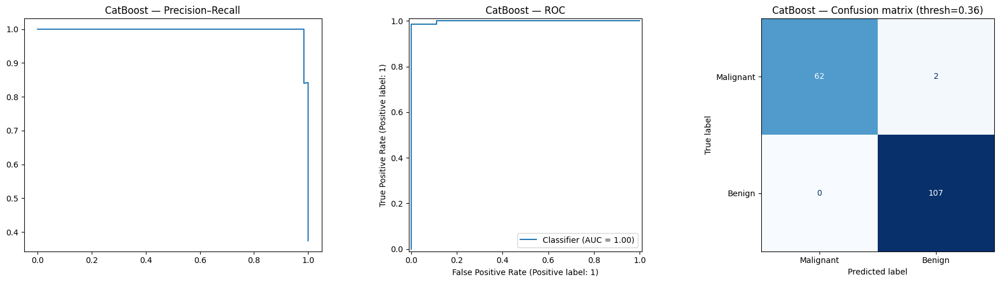


CatBoost — Important Features



,feature,transformation,importance,permutation_importance
0,worst radius,raw,29.812977,0.065497
1,worst texture,raw,9.905423,0.012865
2,worst concave points,raw,9.127217,0.012281
3,mean concave points,raw,12.102666,0.011696
4,worst concavity,raw,5.488889,0.009357
5,mean radius,raw,6.151510,-0.007018
6,mean texture,raw,7.980234,0.004678
7,worst symmetry,raw,3.106963,0.004678
8,worst smoothness,raw,2.266447,0.004094
9,mean smoothness,raw,2.445482,0.003509


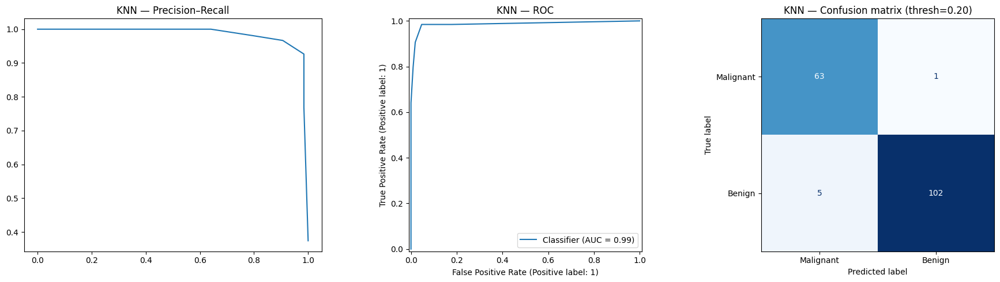


KNN — Important Features



,feature,transformation,permutation_importance
0,mean radius,raw,0.198830
1,worst smoothness,raw,0.040936
2,worst compactness,log,0.038012
3,mean texture,raw,0.034503
4,worst symmetry,log,0.019298
5,mean fractal dimension,log,0.011696
6,mean symmetry,raw,0.008187
7,worst concavity,log,0.007602


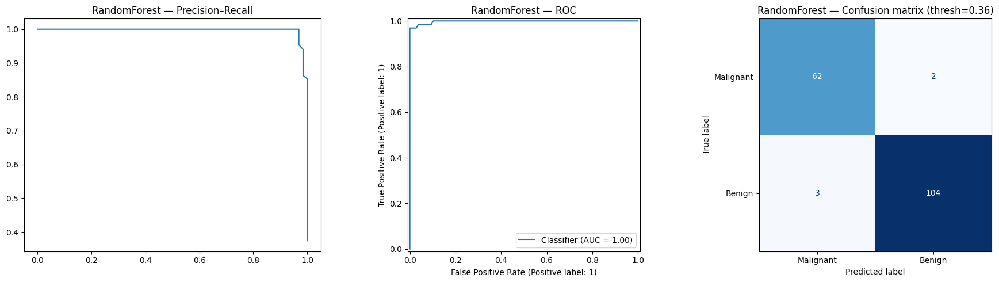


RandomForest — Important Features



,feature,transformation,importance,permutation_importance
0,worst radius,raw,0.229451,0.049708
1,worst concave points,raw,0.166508,0.022807
2,worst concavity,raw,0.075413,0.017544
3,mean texture,raw,0.030223,0.016959
4,worst texture,raw,0.028218,0.012865
5,mean concave points,raw,0.190403,0.009357
6,mean concavity,raw,0.072198,0.004678
7,mean fractal dimension,raw,0.013796,-0.004678
8,worst fractal dimension,raw,0.009553,-0.004678
9,worst compactness,raw,0.016197,-0.004094


In [173]:
# Top 5 Models and their precision-recall and roc curves as well as confusion matrix and feature importance
top_models = (visualizer.test_df
              .sort_values('f2', ascending = False)['model']
              .unique()[:5])

for model_name in top_models:
    pipe = visualizer.best_pipelines[model_name]

    # Now you can call each method individually
    visualizer.plot_evaluation_metrics(model_name, pipe)
    visualizer.importance_table(model_name, pipe)


XGBoost, the top-performing model, misclassified a single malignant case as benign. While mean concave points is used more frequently in tree construction than worst radius (feature importance: 0.265 vs 0.235), worst radius contributes more to predictiong based on permutation importance (0.094 vs 0.016), highlighting a distinction between features that are useful for constructing decision rules and those that the model relies on most for accurate predictions.

Across models, radial tumor features were consistently among the strongest predictors of malignancy. Tree-based models tended to prioritize worst radius, whereas KNN placed greater emphasis on mean radius, reflecting differences in how these model classes encode feature interactions and scale effects.

Finally, tree-based models were more prone to false negatives (misclassifying malignant cases as benign), whereas other models show a relatively higher tendency toward false positives (benign cases classified as malignant), indicating different trade-offs in sensitivity and decision boundaries across model classes.

### Model Results

In [174]:
# View Consolidated Results
model_results = analyzer.results_df
model_results = pd.concat([model_results, pd.DataFrame([baseline])], ignore_index = True)
display(model_results)

,model,threshold,accuracy,precision,recall,f1,f2,pr_auc,roc_auc,brier_score,log_loss,ece,cv_pr_auc,cv_pr_auc_std
0,XGBoost,0.298792,0.994152,1.000000,0.984375,0.992126,0.987461,0.994684,0.995181,0.015913,0.070790,0.027647,0.986190,0.007844
1,Lasso,0.364286,0.976608,0.954545,0.984375,0.969231,0.978261,0.997319,0.998394,0.021141,0.087502,0.044454,0.989024,0.007529
2,CatBoost,0.360612,0.988304,1.000000,0.968750,0.984127,0.974843,0.997533,0.998248,0.020245,0.080185,0.044059,0.983651,0.009066
3,KNN,0.201104,0.964912,0.926471,0.984375,0.954545,0.972222,0.977828,0.985981,0.037193,0.313535,0.052632,0.951638,0.014123
4,RandomForest,0.363469,0.970760,0.953846,0.968750,0.961240,0.965732,0.996775,0.997956,0.024758,0.095627,0.055906,0.984331,0.008495
5,ElasticNet,0.479796,0.964912,0.939394,0.968750,0.953846,0.962733,0.990958,0.993721,0.029098,0.101630,0.027234,0.985519,0.006761
6,Ridge,0.465918,0.964912,0.939394,0.968750,0.953846,0.962733,0.992753,0.995035,0.029218,0.105897,0.043315,0.985824,0.006700
7,SVM linear,0.310000,0.959064,0.925373,0.968750,0.946565,0.959752,0.992449,0.994743,0.027457,0.100275,0.035504,0.986442,0.006673
8,NaiveBayes,0.690725,0.953216,0.911765,0.968750,0.939394,0.956790,0.985756,0.990946,0.042326,0.236111,0.043602,0.972337,0.011376
9,SVM rbf,0.291633,0.964912,0.953125,0.953125,0.953125,0.953125,0.993281,0.995035,0.022690,0.087914,0.030699,0.984891,0.006184


XGBoost achieved the strongest overall performance considering threshold and probabilitistic metrics with the highest F2 score (0.987), recall (0.984), and the lowest Brier score (0.0159); these indicate strong sensitivity to malignant cases and well-calibrated probability estimates.  In contrast to Lasso and Ridge models which achieved the same recall but lower precision, XGBoost maintained a more favorable balance between false negatives and false positives.

In [175]:
# Chosen hyperparameters after RandomizedSearchCV
best_models = []

for name, pipe in evaluator.best_pipelines.items():
    params = pipe.named_steps['model'].get_params()
    model_params = {'model': name, **params}
    best_models.append(model_params)

best_df = pd.DataFrame(best_models)

for name in best_df['model'].unique():
    display (best_df
       .query(f"model == '{name}'")
       .dropna(axis = 1)
       .iloc[0])

,0
model,Logistic
C,1.0
class_weight,balanced
dual,False
fit_intercept,True
intercept_scaling,1.0
max_iter,5000.0
multi_class,deprecated
penalty,l2
solver,lbfgs


,1
model,Lasso
C,0.28547
class_weight,balanced
dual,False
fit_intercept,True
intercept_scaling,1.0
max_iter,5000.0
multi_class,deprecated
penalty,l1
solver,saga


,2
model,Ridge
C,1.577798
class_weight,balanced
dual,False
fit_intercept,True
intercept_scaling,1.0
max_iter,5000.0
multi_class,deprecated
penalty,l2
solver,saga


,3
model,ElasticNet
C,8.70667
class_weight,balanced
dual,False
fit_intercept,True
intercept_scaling,1.0
l1_ratio,0.6
max_iter,5000.0
multi_class,deprecated
penalty,elasticnet


,4
model,RandomForest
class_weight,balanced
random_state,42.0
verbose,0
warm_start,False
bootstrap,True
ccp_alpha,0.0
criterion,gini
max_depth,20.0
max_features,sqrt


,5
model,DecisionTree
class_weight,balanced
random_state,42.0
ccp_alpha,0.0
criterion,gini
max_depth,20.0
min_impurity_decrease,0.0
min_samples_leaf,5.0
min_samples_split,10.0
min_weight_fraction_leaf,0.0


,6
model,LightGBM
random_state,42.0
verbose,-1
max_depth,5.0
n_estimators,500.0
boosting_type,gbdt
colsample_bytree,1.0
importance_type,split
learning_rate,0.05
min_child_samples,20.0


,7
model,XGBoost
random_state,42.0
max_depth,3.0
n_estimators,400.0
learning_rate,0.05
objective,binary:logistic
subsample,0.8
enable_categorical,False
eval_metric,logloss


,8
model,CatBoost
random_state,42.0
verbose,0
learning_rate,0.01
iterations,400.0
depth,4.0


,9
model,SVM rbf
C,1.0
class_weight,balanced
max_iter,-1.0
tol,0.001
verbose,False
gamma,scale
break_ties,False
cache_size,200.0
coef0,0.0


,10
model,SVM linear
C,1.0
class_weight,balanced
max_iter,-1.0
tol,0.001
verbose,False
gamma,scale
break_ties,False
cache_size,200.0
coef0,0.0


,11
model,KNN
algorithm,auto
leaf_size,30.0
metric,minkowski
n_neighbors,5.0
p,2.0
weights,uniform


,12
model,NaiveBayes
var_smoothing,0.0


The convergence of high performance across the different models with relatively simple hyperparameters suggests that the data is intrinsically well-separated.

### Best Classification Model

XGBoost is the highest performing model with prioritization on F2 score, and this section is dedicated to its SHAP analysis to understand the features impact on model prediction.

In [176]:
# Select best model
best_model_name = analyzer.best_model_name
print('✅ Best Model:', best_model_name)

✅ Best Model: XGBoost


In [177]:
# Hyperparameters for XGBoost
xgb = (best_df
       .query("model == 'XGBoost'")
       .dropna(axis = 1)
       .iloc[0]
)

display(xgb)

,7
model,XGBoost
random_state,42.0
max_depth,3.0
n_estimators,400.0
learning_rate,0.05
objective,binary:logistic
subsample,0.8
enable_categorical,False
eval_metric,logloss


The optimized XGBoost model used shallow trees (max depth = 3) with a low learning rate (0.05) and a larger number of estimators (400), reflecting a conservative boosting strategy that prioritizes generalization and stable probability estimates. Subsampling of 0.8 introduced additional regularization, while optimization via log loss supported well-calibrated predictions.

/content/modeling.py:1829: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_sample,


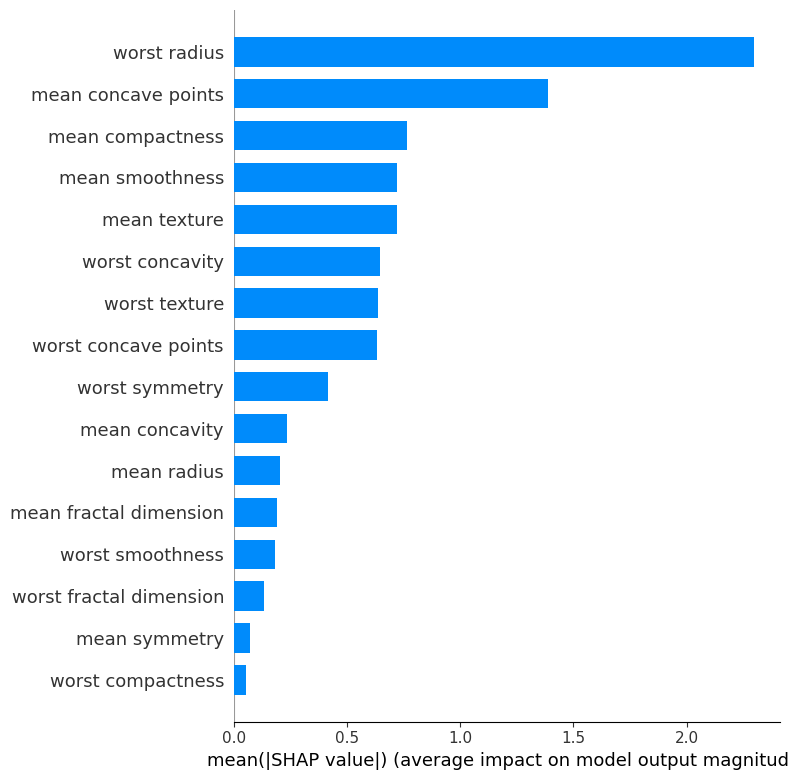

/content/modeling.py:1833: FutureWarning: The NumPy global RNG was seeded by calling `np.random.seed`. In a future version this function will no longer use the global RNG. Pass `rng` explicitly to opt-in to the new behaviour and silence this warning.
  shap.summary_plot(shap_values, X_sample, feature_names=feature_names)


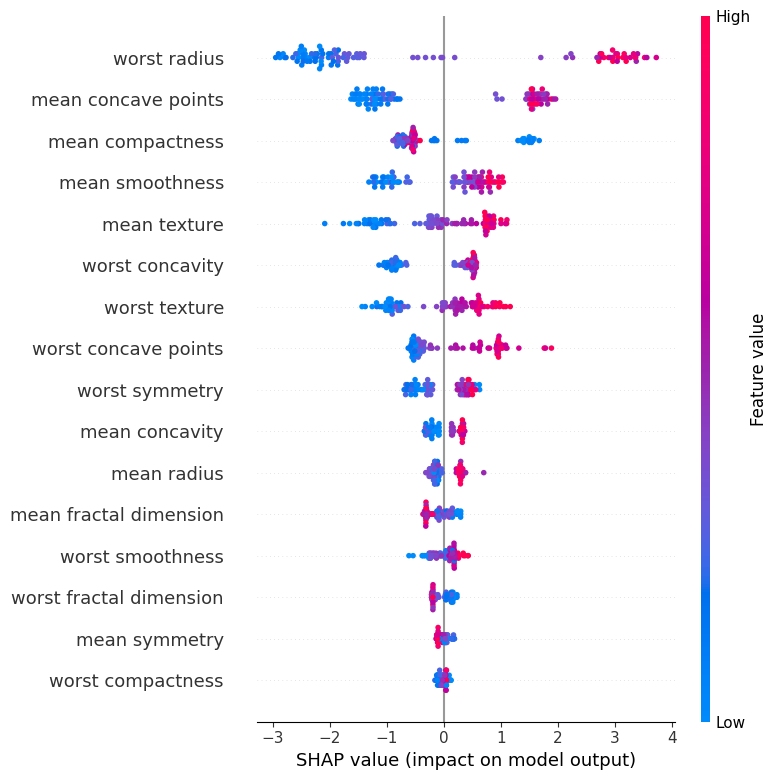

In [178]:
visualizer.plot_shap_analysis(name = best_model_name)

In this SHAP analysis of 100 randomly chosen samples, worst radius has the greatest impact on the prediction magnitude followed by mean concave points and mean compactness.  While worst radius and mean concave points consistently drive stronger deviations in the output, mean compactness shows a more localized effect with SHAP values mostly close to 0, suggesting a more contextual contribution.

#### Worst Radius (Automatic SHAP dependence plot)

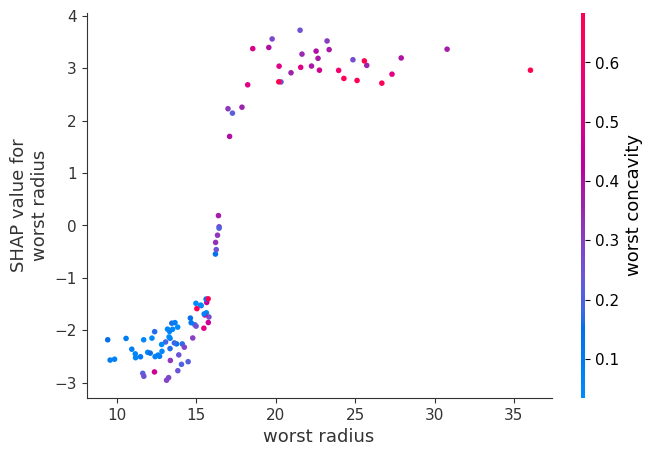

In [179]:
visualizer.plot_shap_dependence()

The SHAP dependence plot shows a nonlinear threshold for worst radius between 15-18 where there is a stronger indication for malignancy if values are greater than the threshold. Concurrently, higher values of worst concavity are seen above this threshold too, which suggests that concavity may reinforce predictions.  

If worst radius values are lower than the threshold, there is a strong indication for benign predictions yet worst concavity values are mixed, indicating that worst concavity has a weaker contribution. Worst concavity serves a context-dependent role in predictions.

#### Mean Concave Points SHAP Dependence Plot

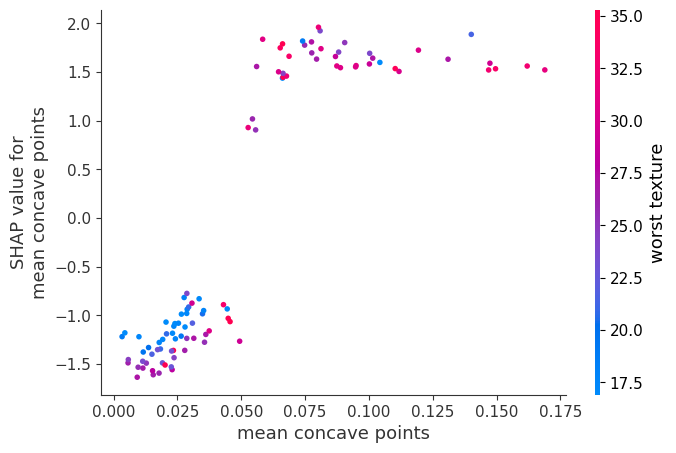

In [180]:
visualizer.plot_shap_dependence('mean concave points')

The SHAP dependence plot for mean concave points shows a clear threshold at approximately 0.05, with values above this level associated with large positive SHAP values and a strong push toward malignant predictions. Above this threshold, worst texture values tend to be higher and align with increased SHAP values, suggesting a reinforcing effect in this region.

Below the threshold, SHAP values are lower and more consistent with benign predictions, while worst texture values are more mixed, indicating a weaker and less consistent contribution.  Worst texture serves a more context-dependent role.

#### Mean Compactness SHAP Dependence Plot

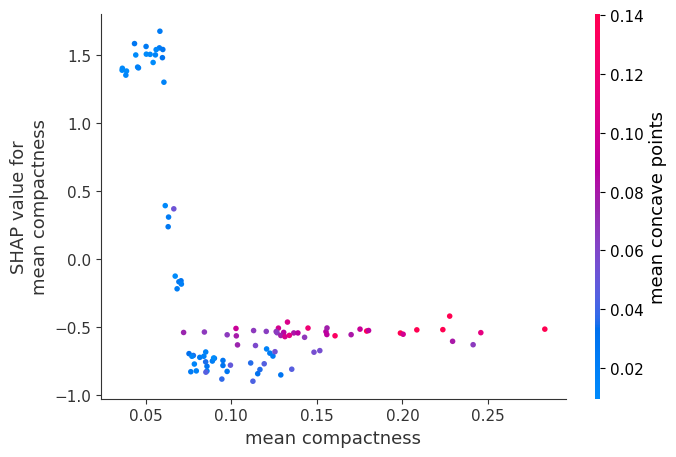

In [181]:
visualizer.plot_shap_dependence('mean compactness')

In this SHAP dependence plot for mean compactness, there is also a clear threshold between 0.06-0.08.  Mean compactness values of less than 0.06 are associated with higher SHAP values while values over 0.08 are associated with negative SHAP contributions.  However, this effect is modulated by mean concave points.

At low levels of mean concave points, low compactness values correspond to high SHAP values, suggesting that compactness becomes a discriminating feature when other malignancy indicators are weak. In contrast, mean compactness has a diminished and more consistent negative contribution at higher values ofmean concave points, indicating that its influence is secondary and context-dependent.

### Best Model Error Analysis

The best classification model had no false positives but 1 false negative in which it was highly confident that the tumor cell sample was benign (y_proba = 0.003594). This sample did not exhibit outlier values across any features.

In [182]:
# Run error analysis
errors = evaluator.analyze_errors()

for key in list(errors.keys())[1:]:
    display(key, errors[key])

'false_positives'

,mean radius,mean texture,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,worst radius,worst texture,...,worst concavity,worst concave points,worst symmetry,worst fractal dimension,y_true,y_pred,y_proba,is_error,zscore_outlier,iqr_outlier


'false_negatives'

,mean radius,mean texture,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,worst radius,worst texture,...,worst concavity,worst concave points,worst symmetry,worst fractal dimension,y_true,y_pred,y_proba,is_error,zscore_outlier,iqr_outlier
73,13.8,15.79,0.1007,0.128,0.07789,0.05069,0.1662,0.06566,16.57,20.86,...,0.2779,0.1383,0.2589,0.103,1,0,0.003594,True,False,False


'confident_errors'

,mean radius,mean texture,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,worst radius,worst texture,...,worst concave points,worst symmetry,worst fractal dimension,y_true,y_pred,y_proba,is_error,zscore_outlier,iqr_outlier,confidence
73,13.8,15.79,0.1007,0.128,0.07789,0.05069,0.1662,0.06566,16.57,20.86,...,0.1383,0.2589,0.103,1,0,0.003594,True,False,False,0.996406


'summary'

,zscore_outlier,iqr_outlier
is_error,,
Correct,0.1,0.205882
Incorrect,0.0,0.000000


#### Distribution of true values and incorrect predictions

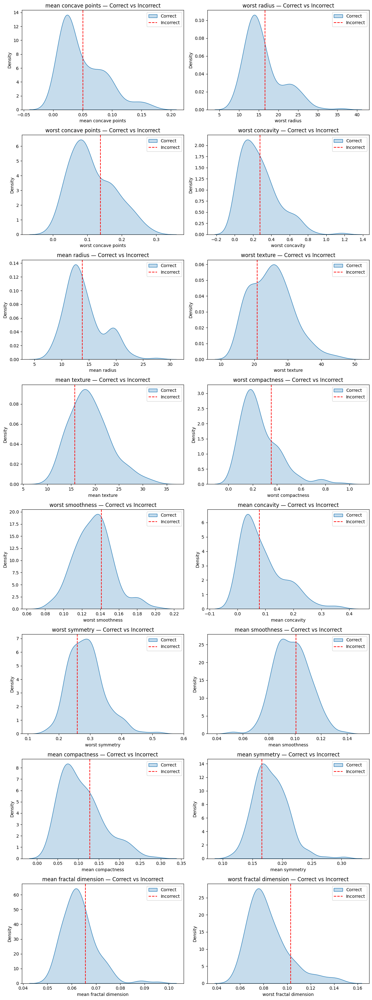

In [183]:
# View Error Distributions

visualizer.plot_error_distributions()

While the false negative sample does not exhibit outlier feature values, some of its feature have values that lie near the transition zone between the peaks of their multimodal distributions (e.g. mean concave points, worst radius, worst concave points, worst texture, worst compactness, and mean compactness). This suggests that the sample is positioned near a decision boundary, where the XGBoost model may experience uncertainty in classification.

#### Feature contributions to incorrect prediction

,y_true,y_pred,y_proba
148,1,0,0.003594


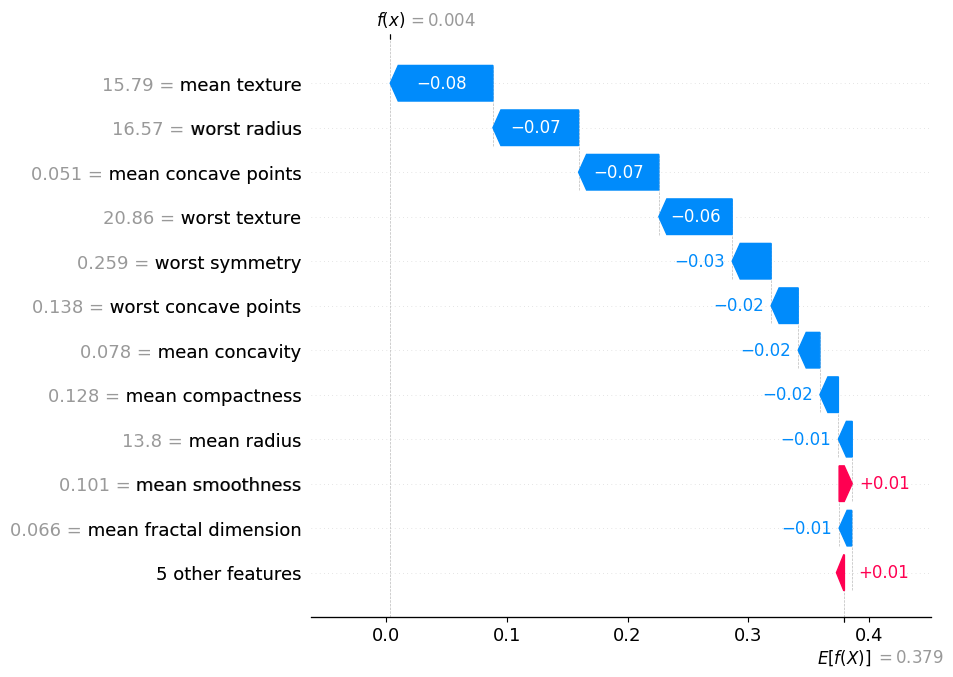

In [184]:
# View Confident Errors with Shap

visualizer.explain_confident_errors_with_shap(max_samples = 3)

Strong features, such as worst radius, mean concave points, and texture features, influenced the model's benign classification, while weaker signals of malignancy from mean smoothness and others were insufficient to overcome the stronger signals.

## Conclusion

The goals of this project were to identify features that are most indicative of malignancy as well as develop an accurate classification model. The bootstrapped Firth's logistic regression of 5000 resamples was used to assess the stability of features selected. This analysis showed that features related to tumor size and texture, particularly worst radius, worst texture, and smoothness-related measures, exhibited stable directional associations with malignancy across resamples.

In parallel, tree-based models, such as XGBoost, achieved the strongest predictive performance with worst radius as the most influential feature in predicting malignancy. The SHAP analysis of 100 randomly selected samples revealed non-linear threshold effects and feature interactions, indicating that model predictions are driven by both dominant structural features and context-dependent feature combinations.

## AI Disclaimer

AI tools were used to support code development. Final interpretations and conclusions reflect independent analysis.